In [1]:
import pandas as pd
from textProcessing import *
from vectorization import *
from clustering import *
from word_embedding import *
from paths import * 

______________
TEXT PROCESSING
__________________

In [2]:
path = paths.dataset_two_collection

In [4]:
raw_data = textProcessing.readDataset(path)
raw_data.columns =['text']
raw_data.head(7)

#raw_data.to_csv('C:\\Users\\hp\\Desktop\\newnew.tsv', sep='\t', index=False, encoding='utf-8')

,text
0,"Multiclassing no longer takes an XP hit, and y..."
1,There's a fairly large smattering of stuff. He...
2,"In 3rd edition this was not an official rule, ..."
3,The only official ruling I can recall in any c...
4,"I like this one, that I use on occasion: ‎Jrey..."
5,"Sounds like ""Everway,"" which came out in the m..."
6,I've only ever used it to get that one feat or...


In [5]:
normalaized = textProcessing.normalization(raw_data['text'])
normalaized.head(7)

0    Multiclassing no longer takes an XP hit, and y...
1    There's a fairly large smattering of stuff. He...
2    In 3rd edition this was not an official rule, ...
3    The only official ruling I can recall in any c...
4    I like this one, that I use on occasion: ‎Jrey...
5    Sounds like "Everway," which came out in the m...
6    I've only ever used it to get that one feat or...
Name: text, dtype: object

In [6]:
toLowercase = textProcessing.toLowercase(normalaized)
toLowercase.head(7)

0    multiclassing no longer takes an xp hit, and y...
1    there's a fairly large smattering of stuff. he...
2    in 3rd edition this was not an official rule, ...
3    the only official ruling i can recall in any c...
4    i like this one, that i use on occasion: ‎jrey...
5    sounds like "everway," which came out in the m...
6    i've only ever used it to get that one feat or...
Name: text, dtype: object

In [7]:
without_url = textProcessing.delete_url(toLowercase)
without_url.head(7)

0    multiclassing no longer takes an xp hit, and y...
1    there's a fairly large smattering of stuff. he...
2    in 3rd edition this was not an official rule, ...
3    the only official ruling i can recall in any c...
4    i like this one, that i use on occasion: ‎jrey...
5    sounds like "everway," which came out in the m...
6    i've only ever used it to get that one feat or...
Name: text, dtype: object

In [8]:
without_punctuatoin = textProcessing.delete_punctuation(without_url)
without_punctuatoin.head(7)

0    multiclassing no longer takes an xp hit and yo...
1    theres a fairly large smattering of stuff here...
2    in 3rd edition this was not an official rule b...
3    the only official ruling i can recall in any c...
4    i like this one that i use on occasion jreysts...
5    sounds like everway which came out in the mid1...
6    ive only ever used it to get that one feat or ...
Name: text, dtype: object

In [9]:
without_dates_and_times = textProcessing.delete_dates_and_times(without_punctuatoin)
without_dates_and_times.head(7)

0    multiclassing no longer takes an xp hit and yo...
1    theres a fairly large smattering of stuff here...
2    in 3rd edition this was not an official rule b...
3    the only official ruling i can recall in any c...
4    i like this one that i use on occasion jreysts...
5    sounds like everway which came out in the mid1...
6    ive only ever used it to get that one feat or ...
Name: text, dtype: object

In [10]:
without_digits = textProcessing.delete_numbers(without_dates_and_times)
without_digits.head(7)
#or
# num_to_words = without_dates_and_times.apply(convertNumToWords2)
# num_to_words.head(7)


0    multiclassing no longer takes an xp hit and yo...
1    theres a fairly large smattering of stuff here...
2    in rd edition this was not an official rule bu...
3    the only official ruling i can recall in any c...
4    i like this one that i use on occasion jreysts...
5    sounds like everway which came out in the mids...
6    ive only ever used it to get that one feat or ...
Name: text, dtype: object

In [11]:
tokenized_wihtout_stopwords=without_digits.apply(textProcessing.tokenize_and_remove_stopwords)

In [12]:
stemmed = tokenized_wihtout_stopwords.apply(textProcessing.stemming)

In [13]:
stemmed.to_csv(paths.processed_dataset_two, sep='\t', index=False, encoding='utf-8')

_____________________________
PRE-PROCESS IN ONE FUNCTION
_______________________________

In [ ]:
final = textProcessing.ds_pre_processing2(path)
final.head(7)

In [ ]:
final.to_csv(paths.processed_dataset_two, sep='\t', index=False, encoding='utf-8')

_____________
VECTORIZATION
_____________

In [3]:
processed_ds = pd.read_csv(paths.processed_dataset_two ,encoding='utf-8' ,sep='\t')

In [4]:
path = paths.tfidf_output
dsPath = paths.processed_dataset_two
qryPath = paths.dataset_two_question_forum

processed_qrs = textProcessing.ds_pre_processing2(qryPath)

processed_qrs.to_csv(paths.processed_question_forum_two, sep='\t', index=False, encoding='utf-8')

processed_qrs_path = paths.processed_question_forum_two

tfidf(dsPath,processed_qrs_path,path,"_2")

C:\Users\OMRAN\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\sklearn\feature_extraction\text.py:525: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


_____________________
PRE-PROCESS QUERY
________________________ 

In [5]:
processed_qry = textProcessing.qry_pre_processing("Can you milk an Ivory Goat?")
model_path = paths.dataset_two_model
docs_path = paths.dataset_two_tfidf_matrix

qry = []

for i in processed_qry:
    i=' '.join(i)
    qry.append(i)

print(qry)


['milk ivori goat dollar']


________________________
COSINE SIMILARITY BETWEEN ONE QUERY AND ALL DOCS
_________________________

In [6]:
similarity = calculate_simi(qry, model_path, docs_path)
print(similarity)
# [54556, 54557]}

[54557, 54556, 82262, 82263, 34789, 103564, 189471, 82274, 128051, 34790]


______________________
CLUSTERING
_______________________

Document 0 is in cluster 22
Document 1 is in cluster 22
Document 2 is in cluster 16
Document 3 is in cluster 16
Document 4 is in cluster 7
Document 5 is in cluster 7
Document 6 is in cluster 22
Document 7 is in cluster 7
Document 8 is in cluster 22
Document 9 is in cluster 16
Document 10 is in cluster 21
Document 11 is in cluster 16
Document 12 is in cluster 7
Document 13 is in cluster 21
Document 14 is in cluster 11
Document 15 is in cluster 21
Document 16 is in cluster 7
Document 17 is in cluster 21
Document 18 is in cluster 7
Document 19 is in cluster 7
Document 20 is in cluster 11
Document 21 is in cluster 11
Document 22 is in cluster 7
Document 23 is in cluster 11
Document 24 is in cluster 11
Document 25 is in cluster 20
Document 26 is in cluster 16
Document 27 is in cluster 20
Document 28 is in cluster 16
Document 29 is in cluster 11
Document 30 is in cluster 11
Document 31 is in cluster 7
Document 32 is in cluster 11
Document 33 is in cluster 16
Document 34 is in cluster 16
Docu

['Document 0 is in cluster 22',
 'Document 1 is in cluster 22',
 'Document 2 is in cluster 16',
 'Document 3 is in cluster 16',
 'Document 4 is in cluster 7',
 'Document 5 is in cluster 7',
 'Document 6 is in cluster 22',
 'Document 7 is in cluster 7',
 'Document 8 is in cluster 22',
 'Document 9 is in cluster 16',
 'Document 10 is in cluster 21',
 'Document 11 is in cluster 16',
 'Document 12 is in cluster 7',
 'Document 13 is in cluster 21',
 'Document 14 is in cluster 11',
 'Document 15 is in cluster 21',
 'Document 16 is in cluster 7',
 'Document 17 is in cluster 21',
 'Document 18 is in cluster 7',
 'Document 19 is in cluster 7',
 'Document 20 is in cluster 11',
 'Document 21 is in cluster 11',
 'Document 22 is in cluster 7',
 'Document 23 is in cluster 11',
 'Document 24 is in cluster 11',
 'Document 25 is in cluster 20',
 'Document 26 is in cluster 16',
 'Document 27 is in cluster 20',
 'Document 28 is in cluster 16',
 'Document 29 is in cluster 11',
 'Document 30 is in cluster 

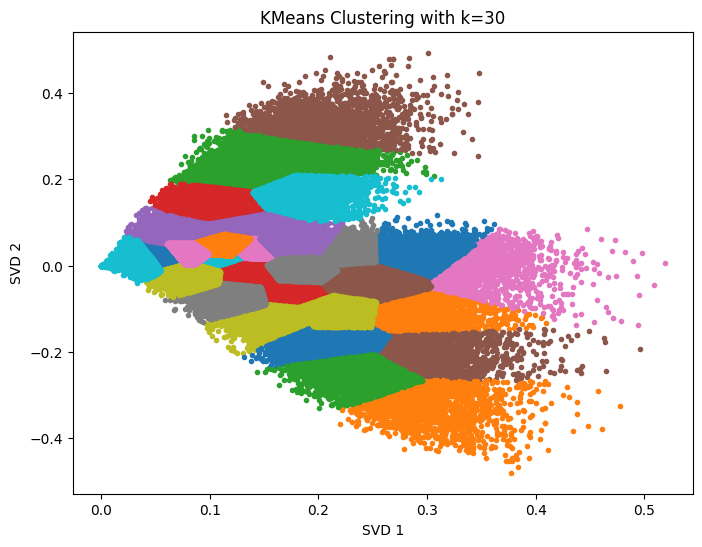

In [6]:
k=30
docsPath = paths.dataset_two_tfidf_matrix
writing_path = paths.kmeans_output + "\\docs_matrix_after_kmeans_2.pickle"
img_writing_path = paths.kmeans_output + '\\clusters_2_tsvd.png'
dataset = paths.dataset_two_collection
clustering.clustering(k,dataset ,docsPath,writing_path,img_writing_path)

_____________________
WORD EMBEDDING
___________________

In [2]:
path = paths.embedding_output
dsPath = paths.processed_dataset_two
qryPath = paths.dataset_two_question_forum
processed_qrs_path = paths.processed_question_forum_two

In [ ]:
#word_embedding.embedding(dsPath, processed_qrs_path, path, "_2")

In [6]:
processed_qry = textProcessing.qry_pre_processing("Would the One Ring even work for anyone but Sauron?")

qry = []

for i in processed_qry:
    i=' '.join(i)
    qry.append(i)

In [7]:
embedded_docs = paths.embedded_dataset_two
docs = pickle.load(open(embedded_docs, "rb"))

In [8]:
word_embedding.cos_similarity(embedded_docs,qry)

[101618, 89273, 221416, 151458, 223839, 124353, 215524, 115476, 16, 150571]